# **Product Sales Forecasting**

**Project Objective**

Need and Use of Product Sales Forecasting
Effective sales forecasting is fundamental for multiple aspects of retail management and operation, including:

1.	**Inventory Management:** Accurate sales forecasts help ensure that stores maintain optimal inventory levels—enough to meet customer demand without overstocking, which can lead to increased costs or waste, especially in the case of perishable goods.

2.	**Financial Planning:** Forecasting sales allows businesses to estimate future revenue and manage budgets more effectively. This is crucial for allocating resources to areas such as marketing, staffing, and capital investments.

3.	**Marketing and Promotions:** Understanding when sales peaks and troughs are likely to occur enables retailers to plan effective marketing campaigns and promotional offers to boost revenue or manage customer flow.

4.	**Supply Chain Optimization:** Sales forecasts inform production schedules, logistics, and distribution plans, ensuring that products are available where and when they are needed, thereby reducing transportation and storage costs.

5.	**Strategic Decision Making:** Long-term sales forecasting supports broader business strategies, including store expansions, market entry, and other capital expenditures.

## 1. Dataset Loading

In [ ]:
# Import Basic libraries
import pandas as pd
import numpy as np

# Import Visualization libraries
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Install MLflow
!pip install mlflow

# Import MLFLow libraries
import mlflow

# Suppress the specific ConvergenceWarning
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)


In [ ]:
# Read
train = pd.read_csv('/content/TRAIN.csv')
test = pd.read_csv('/content/TEST.csv')

In [ ]:
train.sample(5)

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,#Order,Sales
158771,T1158772,283,S4,L1,R1,2019-03-11,0,Yes,82,41019.0
58503,T1058504,76,S2,L3,R3,2018-06-10,0,No,41,28542.0
110861,T1110862,359,S2,L3,R2,2018-10-31,0,Yes,48,38724.0
125806,T1125807,201,S4,L1,R1,2018-12-11,0,No,89,43428.0
47737,T1047738,91,S3,L1,R1,2018-05-11,0,No,59,37653.0


In [ ]:
test.sample(5)

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount
17254,T1205595,252,S3,L2,R1,2019-07-18,0,No
15737,T1204078,230,S2,L4,R4,2019-07-14,0,No
17393,T1205734,78,S1,L1,R4,2019-07-18,0,No
21095,T1209436,349,S1,L1,R4,2019-07-28,0,No
3076,T1191417,32,S1,L1,R2,2019-06-09,0,No


## 2. Observations on Data

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ID             188340 non-null  object 
 1   Store_id       188340 non-null  int64  
 2   Store_Type     188340 non-null  object 
 3   Location_Type  188340 non-null  object 
 4   Region_Code    188340 non-null  object 
 5   Date           188340 non-null  object 
 6   Holiday        188340 non-null  int64  
 7   Discount       188340 non-null  object 
 8   #Order         188340 non-null  int64  
 9   Sales          188340 non-null  float64
dtypes: float64(1), int64(3), object(6)
memory usage: 14.4+ MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22265 entries, 0 to 22264
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             22265 non-null  object
 1   Store_id       22265 non-null  int64 
 2   Store_Type     22265 non-null  object
 3   Location_Type  22265 non-null  object
 4   Region_Code    22265 non-null  object
 5   Date           22265 non-null  object
 6   Holiday        22265 non-null  int64 
 7   Discount       22265 non-null  object
dtypes: int64(2), object(6)
memory usage: 1.4+ MB


In [ ]:
train.Date = pd.to_datetime(train.Date)
test.Date = pd.to_datetime(test.Date)

In [ ]:
train.describe().T

,count,mean,min,25%,50%,75%,max,std
Store_id,188340.0,183.0,1.0,92.0,183.0,274.0,365.0,105.366308
Date,188340,2018-09-15 12:00:00.000000256,2018-01-01 00:00:00,2018-05-09 18:00:00,2018-09-15 12:00:00,2019-01-22 06:00:00,2019-05-31 00:00:00,NaN
Holiday,188340.0,0.131783,0.0,0.0,0.0,0.0,1.0,0.338256
#Order,188340.0,68.205692,0.0,48.0,63.0,82.0,371.0,30.467415
Sales,188340.0,42784.327982,0.0,30426.0,39678.0,51909.0,247215.0,18456.708302


In [ ]:
test.describe().T

,count,mean,min,25%,50%,75%,max,std
Store_id,22265.0,183.0,1.0,92.0,183.0,274.0,365.0,105.368395
Date,22265,2019-06-30 23:59:59.999999744,2019-06-01 00:00:00,2019-06-16 00:00:00,2019-07-01 00:00:00,2019-07-16 00:00:00,2019-07-31 00:00:00,NaN
Holiday,22265.0,0.032787,0.0,0.0,0.0,0.0,1.0,0.178082


## 3. Handling missing values and Preprocessing

In [ ]:
train_null = train.isna().sum().sum()
test_null = test.isna().sum().sum()
print(f'There are {train_null} nulls in train dataset and {test_null} nulls in test dataset.')

There are 0 nulls in train dataset and 0 nulls in test dataset.


In [ ]:
# Define dataset type in separate column for train and test
train['Train'] = True
test['Train'] = False

In [ ]:
def decorator(func):
  def wrapper(*args, **kwargs):
    print('='*50)
    result = func(*args, **kwargs)
    print('='*50)
    return result
  return wrapper

@decorator
def df_size(df,typ):
  size = df.memory_usage().sum()/(1024**2)
  print(f'Size of {typ} data is: {size:.2f} MB')
  return size

In [ ]:
# Combine both the dataset into single dataframe
data = pd.concat([train, test])
raw_size = df_size(data, 'Non-Converted')
data.reset_index(drop=True, inplace=True)
# Change Datatypes to optimize sizes
# Store_id as unsigned integer 16 (Range is 1 to 371)
data.Store_id = data.Store_id.astype('uint16')
# Store_Type, Location_Type, Region_Code as categorical
data.Store_Type = data.Store_Type.astype('category')
data.Location_Type = data.Location_Type.astype('category')
data.Region_Code = data.Region_Code.astype('category')
# Holiday and Discount as Boolean
data.Holiday = data.Holiday.astype('bool')
data.replace({'Discount':{'Yes':True, 'No':False}}, inplace=True)
# Drop unnecessary column Transaction ID
data.pop('ID')
data.set_index('Date', inplace=True)
processed_size = df_size(data, 'Converted')
reduction = 100*(raw_size - processed_size)/raw_size
print(f'''Reduction in size after processing is: {reduction:.2f}%''')
print('='*50)

Size of Non-Converted data is: 17.88 MB
Size of Converted data is: 6.43 MB
Reduction in size after processing is: 64.04%


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 210605 entries, 2018-01-01 to 2019-07-31
Data columns (total 9 columns):
 #   Column         Non-Null Count   Dtype   
---  ------         --------------   -----   
 0   Store_id       210605 non-null  uint16  
 1   Store_Type     210605 non-null  category
 2   Location_Type  210605 non-null  category
 3   Region_Code    210605 non-null  category
 4   Holiday        210605 non-null  bool    
 5   Discount       210605 non-null  bool    
 6   #Order         188340 non-null  float64 
 7   Sales          188340 non-null  float64 
 8   Train          210605 non-null  bool    
dtypes: bool(3), category(3), float64(2), uint16(1)
memory usage: 6.4 MB


In [ ]:
data.describe()

,Store_id,#Order,Sales
count,210605.000000,188340.000000,188340.000000
mean,183.000000,68.205692,42784.327982
std,105.366279,30.467415,18456.708302
min,1.000000,0.000000,0.000000
25%,92.000000,48.000000,30426.000000
50%,183.000000,63.000000,39678.000000
75%,274.000000,82.000000,51909.000000
max,365.000000,371.000000,247215.000000


In [ ]:
# Rename #Order column name for ease of use
data.rename(columns={'#Order':'Order'}, inplace=True)

In [ ]:
# Assign index to Exogenous variable dataframe
exog_holiday = data.Holiday
exog_discount = data.Discount
exog = pd.concat([exog_holiday, exog_discount, data.Train], axis=1)
exog_train = exog[exog.Train == True][['Holiday','Discount']]
exog_test = exog[exog.Train == False][['Holiday','Discount']]

## 4. Feature Engineering

In [ ]:
# Developing Features from date
data['Year'] = data.index.year
data['Quarter'] = data.index.quarter
data['Month'] = data.index.month
data['MonthName'] = data.index.month_name()
data['Day'] = data.index.day
data['Week'] = data.index.isocalendar().week
data['Weekday'] = data.index.weekday
data['DayName'] = data.index.day_name()
data['Weekend'] = data.Weekday.apply(lambda x: 'Weekend' if x in ['Saturday','Sunday'] else 'Weekday')

In [ ]:
# Additional features
data['S/O'] = round(data.Sales/data.Order,2)

In [ ]:
data.sample(5)

,Store_id,Store_Type,Location_Type,Region_Code,Holiday,Discount,Order,Sales,Train,Year,Quarter,Month,MonthName,Day,Week,Weekday,DayName,Weekend,S/O
Date,,,,,,,,,,,,,,,,,,,
2019-05-28,213,S1,L1,R2,False,True,74.0,48621.0,True,2019,2,5,May,28,22,1,Tuesday,Weekday,657.04
2018-12-09,355,S2,L4,R2,False,True,42.0,29181.0,True,2018,4,12,December,9,49,6,Sunday,Weekday,694.79
2019-03-13,327,S4,L1,R3,False,True,84.0,43359.0,True,2019,1,3,March,13,11,2,Wednesday,Weekday,516.18
2019-04-10,239,S3,L1,R3,False,True,85.0,56217.0,True,2019,2,4,April,10,15,2,Wednesday,Weekday,661.38
2018-05-12,319,S3,L1,R2,False,False,81.0,52710.0,True,2018,2,5,May,12,19,5,Saturday,Weekday,650.74


In [ ]:
# Split the data into train and test before proceeding further
train = data[data.Train == True]
test = data[data.Train == False]

## 5. EDA

In [ ]:
# **Univariate Analysis: Distribution of numerical data**
fig = make_subplots(rows=1, cols=3, subplot_titles=('Order','Sales','Sales per Order'))
fig.add_trace(go.Histogram(x=train.Order, marker_color='teal'), row=1, col=1)
fig.add_trace(go.Histogram(x=train.Sales, marker_color='orange'), row=1, col=2)
fig.add_trace(go.Histogram(x=train['S/O'], marker_color='purple'), row=1, col=3)
fig.update_layout(title='Distribution of target parameters', showlegend=False, title_x=0.5, title_y=0.1)
fig.show()

In [ ]:
# **Bivariate Analysis: Bar Charts**
order_color = 'darkgreen'
sales_color = 'teal'
fig = make_subplots(rows=2, cols=4)
grouped = train.groupby('Store_Type').agg({'Order':'sum','Sales':'sum'})
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Order, marker=dict(color=order_color)), row=1, col=1)
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Sales, marker=dict(color=sales_color)), row=2, col=1)
grouped = train.groupby('Location_Type').agg({'Order':'sum','Sales':'sum'})
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Order, marker=dict(color=order_color)), row=1, col=2)
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Sales, marker=dict(color=sales_color)), row=2, col=2)
grouped = train.groupby('Region_Code').agg({'Order':'sum','Sales':'sum'})
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Order, marker=dict(color=order_color)), row=1, col=3)
fig.add_trace(go.Bar(x=grouped.index, y=grouped.Sales, marker=dict(color=sales_color)), row=2, col=3)
grouped = train.groupby(['Weekday','DayName']).agg({'Order':'sum','Sales':'sum'}).reset_index()
fig.add_trace(go.Bar(x=grouped.DayName, y=grouped.Order, marker=dict(color=order_color)), row=1, col=4)
fig.add_trace(go.Bar(x=grouped.DayName, y=grouped.Sales, marker=dict(color=sales_color)), row=2, col=4)
fig.update_layout(title='Order, Sales and Sales/Order distribution', showlegend=False, title_x=0.5, title_y=0.85)

fig.update_yaxes(title='Order Volume', row=1, col=1)
fig.update_yaxes(title='Sales Amount', row=2, col=1)

fig.update_xaxes(title='Store Type', row=2, col=1)
fig.update_xaxes(title='Location Type', row=2, col=2)
fig.update_xaxes(title='Region Code', row=2, col=3)

fig.show()

In [ ]:
# **Top/Bottom 10s**
fig = make_subplots(rows=2, cols=1, subplot_titles=('Top/Bottom 10 Store IDs', ''))
top_order = train.groupby('Store_id').agg({'Order':'sum'}).sort_values('Order', ascending=False).head(10)
top_sales = train.groupby('Store_id').agg({'Sales':'sum'}).sort_values('Sales', ascending=False).head(10)
bottom_order = train.groupby('Store_id').agg({'Order':'sum'}).sort_values('Order', ascending=False).tail(10)
bottom_sales = train.groupby('Store_id').agg({'Sales':'sum'}).sort_values('Sales', ascending=False).tail(10)
tb_order = pd.concat([top_order, bottom_order])
tb_sales = pd.concat([top_sales, bottom_sales])
fig.add_trace(go.Bar(x=tb_order.index, y=tb_order.Order, name='Order', marker=dict(color=order_color)), row=1, col=1)
fig.add_trace(go.Bar(x=tb_sales.index, y=tb_sales.Sales, name='Sales', marker=dict(color=sales_color)), row=2, col=1)
fig.update_layout(xaxis=dict(type='category'),
                  xaxis2=dict(type='category'),
                  yaxis=dict(title='Order Volume'),
                  yaxis2=dict(title='Sales Amount'),
                  showlegend=False, width=500)
fig.show()

In [ ]:
def scatter_plots(df, column):
  categories = df[column].astype('category').unique().sort_values()
  fig = make_subplots(rows=1, cols=len(categories),
                      subplot_titles=[str(c) for c in categories])
  for i, category in enumerate(categories):
    fig.add_trace(go.Scatter(x=df[df[column] == category]['Order'],
                             y=df[df[column] == category]['Sales'],
                             mode='markers', marker=dict(size=2), name=category,),row=1, col=i+1)
    fig.update_xaxes(range = [0,300], row=1, col=i+1)
    fig.update_yaxes(range = [0,250000], row=1, col=i+1)
  fig.update_layout(title=f'{column} wise Order v/s Sales Scatter Plot', height = 400, showlegend=False, title_x=0.5)
  fig.show()

In [ ]:
ignore = False
if not ignore:
  scatter_plots(train,'Store_Type')
  scatter_plots(train,'Region_Code')
  scatter_plots(train,'Location_Type')
  scatter_plots(train,'Holiday')
  scatter_plots(train,'Discount')

### Hypothesis Testing

In [ ]:
# **Chi-Square test for dependency**
from scipy.stats import chi2_contingency

@decorator
def chi2test(data, category1, category2, alpha=0.05):
  data = data.groupby(by=[category1, category2]).agg({'Order':'sum', 'Sales':'sum'}).reset_index()
  test = chi2_contingency(data.pivot(index=category1,columns=category2,values='Order').fillna(0))
  order_dependency = test.pvalue < alpha
  if order_dependency:
    print(f'Reject the Null Hypothesis. For Order volume, {category1} and {category2} are dependent', end=" | ")
  else:
    print(f'Fail to reject the Null Hypothesis. For Order volume, {category1} and {category2} are independent', end=" | ")
  print(f'Test statistics:{test.statistic},\tp-value:{test.pvalue}')

  test = chi2_contingency(data.pivot(index=category1,columns=category2,values='Sales').fillna(0))
  sales_dependency = test.pvalue < alpha
  if sales_dependency:
    print(f'Reject the Null Hypothesis. For Sales amount, {category1} and {category2} are dependent', end=" | ")
  else:
    print(f'Fail to reject the Null Hypothesis. For Sales amount, {category1} and {category2} are independent', end=" | ")
  print(f'Test statistics:{test.statistic},\tp-value:{test.pvalue}')

  return {'C1':category1, 'C2':category2,'Order': order_dependency, 'Sales': sales_dependency}

In [ ]:
from itertools import permutations
columns = ['Store_Type', 'Location_Type', 'Region_Code', 'Holiday', 'Discount', 'MonthName', 'DayName']
dependancy_summary = pd.DataFrame([chi2test(train,c1,c2) for c1,c2 in list(permutations(columns,2))])

Reject the Null Hypothesis. For Order volume, Store_Type and Location_Type are dependent | Test statistics:8560447.197307907,	p-value:0.0
Reject the Null Hypothesis. For Sales amount, Store_Type and Location_Type are dependent | Test statistics:5347008627.585614,	p-value:0.0
Reject the Null Hypothesis. For Order volume, Store_Type and Region_Code are dependent | Test statistics:2063286.1134297573,	p-value:0.0
Reject the Null Hypothesis. For Sales amount, Store_Type and Region_Code are dependent | Test statistics:1263592484.9694943,	p-value:0.0
Reject the Null Hypothesis. For Order volume, Store_Type and Holiday are dependent | Test statistics:27.94049935419796,	p-value:3.7379941858049926e-06
Reject the Null Hypothesis. For Sales amount, Store_Type and Holiday are dependent | Test statistics:21093.7298558246,	p-value:0.0
Reject the Null Hypothesis. For Order volume, Store_Type and Discount are dependent | Test statistics:321.25338064274575,	p-value:2.497032993795113e-69
Reject the Null 

In [ ]:
pd.crosstab(dependancy_summary.C1, dependancy_summary.C2, dependancy_summary.Order, aggfunc='max')

C2,DayName,Discount,Holiday,Location_Type,MonthName,Region_Code,Store_Type
C1,,,,,,,
DayName,NaN,True,True,True,True,True,True
Discount,True,NaN,True,True,True,True,True
Holiday,True,True,NaN,True,True,False,True
Location_Type,True,True,True,NaN,True,True,True
MonthName,True,True,True,True,NaN,True,True
Region_Code,True,True,False,True,True,NaN,True
Store_Type,True,True,True,True,True,True,NaN


In [ ]:
pd.crosstab(dependancy_summary.C1, dependancy_summary.C2, dependancy_summary.Sales, aggfunc='max').fillna(0)

C2,DayName,Discount,Holiday,Location_Type,MonthName,Region_Code,Store_Type
C1,,,,,,,
DayName,0,True,True,True,True,True,True
Discount,True,0,True,True,True,True,True
Holiday,True,True,0,True,True,True,True
Location_Type,True,True,True,0,True,True,True
MonthName,True,True,True,True,0,True,True
Region_Code,True,True,True,True,True,0,True
Store_Type,True,True,True,True,True,True,0


In [ ]:
# **Mean similarity test**
from scipy.stats import f_oneway, kruskal, anderson, levene
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from itertools import combinations

def decorator(func):
  def wrapper(*args, **kwargs):
    print('~'*100)
    print('~'*100)
    result = func(*args, **kwargs)
    print('~'*100)
    print('~'*100)
    return result
  return wrapper

@decorator
def variance_test(data, category, target, alpha=0.05):
  d = data.groupby(by=category).agg(Mean=(target,'mean'), Count=(target, 'size')).reset_index()
  print(f'Hypothesis test whether Mean {target} is same for all {category} or not.\n')
  print(d)
  print('='*53)
  cats = sorted(data[category].unique())
  groups = {}
  for cat in cats:
     groups[cat]=data[data[category] == cat][target]

  # Check for Normality test of all categories
  normality_test = True
  print('Criteria check for ANOVA')
  for cat,group in groups.items():
    if not anderson(group).fit_result.success:
      normality_test = False
      print(f'\033[31m \u274C Group {cat} is not normally distributed.\033[0m')
      break
  if normality_test:
    print('\033[32m \u2705 All groups are normally distributed.\033[0m')
  # Check for levene test
  levene_test = True
  _, p_levene = levene(*groups.values())
  if p_levene < alpha:
    levene_test = False
    print(f'\033[31m \u274C Variance of all groups are not same.\033[0m')
  else:
    print(f'\033[32m \u2705 Variance of all groups are same.\033[0m')

  # Perform One-way ANOVA if criteria meets otheriwse perform Kruskal
  if normality_test and levene_test:
    print('One-Way ANOVA will be performed.')
    _, p_value = f_oneway(*groups.values())
  else:
    print('All criterias not met for ANOVA. Kruskal test will be performed.')
    _, p_value = kruskal(*groups.values())

  # Proceed for ttest_ind if one group has different mean
  if p_value > alpha:
    print(f'p-Value is {p_value} > {alpha} Significance level.\nWe dont have enough evidence to  reject the Null Hypothesis. All means are same.')
    print('='*53)
    return None
  else:
    print(f'p-Value is {p_value} < {alpha} Significance level.\nWe have enough evidence to reject the Null Hypothesis and at least one mean is different.')
    print('='*53)

  tukey = pairwise_tukeyhsd(endog=data[target], groups=data[category], alpha=0.05)
  print(tukey)
  # Extract group1 and group2 using the Tukey object attributes
  group1 = tukey.groupsunique[tukey._multicomp.pairindices[0]]
  group2 = tukey.groupsunique[tukey._multicomp.pairindices[1]]
  pair = [f'{a}-{b}' for a,b in list(zip(group1, group2))]
  reject = tukey.reject

  # Combine group1 and group2 into a DataFrame
  group_pairs = pd.DataFrame({'pair': pair, 'reject': reject})
  same_mean_pairs = group_pairs[group_pairs['reject'] == False]['pair']
  different_mean_pairs = group_pairs[group_pairs['reject'] == True]['pair']
  print(f'\033[34mPairs having different {target} mean are: {",".join(different_mean_pairs.values)}')
  print(f'\033[35mPairs having same {target} mean are: {",".join(same_mean_pairs.values)}\033[0m')

  return None

In [ ]:
from itertools import product
for category, target in product(columns, ['Order', 'Sales']):
  variance_test(train, category, target)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Hypothesis test whether Mean Order is same for all Store_Type or not.

  Store_Type        Mean  Count
0         S1   58.022095  88752
1         S2   40.472799  28896
2         S3   73.663396  24768
3         S4  102.392779  45924
Criteria check for ANOVA
 ✅ All groups are normally distributed.
 ❌ Variance of all groups are not same.
All criterias not met for ANOVA. Kruskal test will be performed.
p-Value is 0.0 < 0.05 Significance level.
We have enough evidence to reject the Null Hypothesis and at least one mean is different.
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
    S1     S2 -17.5493   0.0 -17.9275 -17.1711   True
    S1     S3  15.6413   0.0    15.24  16.0426   

## 6. Data Preperation for modeling

In [ ]:
# Data Preperation for modeling
# Data for Sales forecastig model training
overall_sales = train.groupby(level=0).agg({'Sales':'sum'})
id_wise_sales = pd.crosstab(index=train.index, columns=train.Store_id, values =train.Sales, aggfunc='sum')
store_type_wise_sales = pd.crosstab(index=train.index, columns=train.Store_Type, values =train.Sales, aggfunc='sum')
location_wise_sales = pd.crosstab(index=train.index, columns=train.Location_Type, values =train.Sales, aggfunc='sum')
region_wise_sales = pd.crosstab(index=train.index, columns=train.Region_Code, values =train.Sales, aggfunc='sum')

# Data for Order forecastig model training
overall_order = train.groupby(level=0).agg({'Order':'sum'})
id_wise_order = pd.crosstab(index=train.index, columns=train.Store_id, values =train.Order, aggfunc='sum')
store_type_wise_order = pd.crosstab(index=train.index, columns=train.Store_Type, values =train.Order, aggfunc='sum')
location_wise_order = pd.crosstab(index=train.index, columns=train.Location_Type, values =train.Order, aggfunc='sum')
region_wise_order = pd.crosstab(index=train.index, columns=train.Region_Code, values =train.Order, aggfunc='sum')

# Create a Single DataFrame for Sales and Order
train_sales = pd.concat([overall_sales, id_wise_sales, store_type_wise_sales, location_wise_sales, region_wise_sales], axis=1)
train_order = pd.concat([overall_order, id_wise_order, store_type_wise_order, location_wise_order, region_wise_order], axis=1)

exog_train_holiday = train.groupby(train.index).mean('Holiday')['Holiday']
exog_test_holiday = test.groupby(test.index).mean('Holiday')['Holiday']

In [ ]:
train_sales.sample(5)

,Sales,1,2,3,4,5,6,7,8,9,...,S4,L1,L2,L3,L4,L5,R1,R2,R3,R4
2019-05-04,26870817.0,66564.0,108900.0,143373.0,80760.0,71742.0,103794.0,80607.0,68946.0,37335.0,...,9589005.0,11233155.0,10087737.0,3377775.0,973317.0,1198833.0,10085175.0,6370362.0,7071288.0,3343992.0
2019-03-06,12454518.0,21240.0,32940.0,45627.0,30444.0,38379.0,43050.0,48312.0,48279.0,19758.0,...,4381032.0,5448363.0,4459881.0,1525440.0,461214.0,559620.0,4672971.0,3344001.0,2917881.0,1519665.0
2018-12-04,15449391.0,28968.0,58116.0,50082.0,49113.0,34944.0,16386.0,27153.0,46227.0,44580.0,...,5295081.0,6662946.0,5562822.0,1953468.0,599976.0,670179.0,5677032.0,3947631.0,3746142.0,2078586.0
2019-01-04,17608086.0,33993.0,37722.0,64899.0,43467.0,38835.0,44826.0,43431.0,59667.0,37593.0,...,5828661.0,7898211.0,6009363.0,2224803.0,734679.0,741030.0,6510597.0,5205174.0,3688050.0,2204265.0
2018-06-14,15976260.0,40755.0,49986.0,52989.0,39516.0,43830.0,55038.0,54435.0,52437.0,34188.0,...,5399142.0,6985551.0,5605683.0,2010183.0,637734.0,737109.0,5911314.0,4375833.0,3734988.0,1954125.0


## 7. Time series plots

In [ ]:
# Function to plot the data
def plot_sales(data, code):
  fig = go.Figure()
  fig.add_trace(go.Scatter(x=data.index, y=data[code], mode='lines', name=code))
  fig.add_trace(go.Bar(x=data.index, y=exog_train_holiday, name='campaign', yaxis='y2', opacity=1))
  fig.update_layout(title=f'Timeseries for {code}', showlegend=False, title_x=0.12,
      yaxis=dict(title='Sales Amount'),
      yaxis2=dict(overlaying='y', showline=False, showgrid=False, showticklabels=False, side='right'))
  return fig

def plot_order(data, code):
  fig = go.Figure()
  fig.add_trace(go.Scatter(x=data.index, y=data[code], mode='lines', name=code))
  fig.add_trace(go.Bar(x=data.index, y=exog_train_holiday, name='campaign', yaxis='y2', opacity=1))
  fig.update_layout(title=f'Timeseries for {code}', showlegend=False, title_x=0.12,
      yaxis=dict(title='Order Volume'),
      yaxis2=dict(overlaying='y', showline=False, showgrid=False, showticklabels=False, side='right'))
  return fig


In [ ]:
fig = make_subplots(rows=2, cols=1, specs=[[{"secondary_y": True}], [{"secondary_y": True}]])
for trace in plot_order(overall_order, 'Order').data:
  secondary_y = "yaxis" in trace and trace["yaxis"] == "y2"
  fig.add_trace(trace, row=1, col=1)
for trace in plot_sales(overall_sales, 'Sales').data:
  secondary_y = "yaxis" in trace and trace["yaxis"] == "y2"
  fig.add_trace(trace, row=2, col=1)
fig.show()

In [ ]:
df_order = region_wise_order
df_sales = region_wise_sales
for code in df_order.columns:
  plot_order(df_order, code).show()
  plot_sales(df_sales, code).show()

In [ ]:
df_order = location_wise_order
df_sales = location_wise_sales
for code in df_order.columns:
  plot_order(df_order, code).show()
  plot_sales(df_sales, code).show()


In [ ]:

df_order = store_type_wise_order
df_sales = store_type_wise_sales
for code in df_order.columns:
  plot_order(df_order, code).show()
  plot_sales(df_sales, code).show()



# B. Stationarity, decomposition, detrending, ACF, and PACF

## 8. Stationarity test and decomposition

Most of timeseries model (like **AR, MA, ARIMA**) works on assumption of Stationarity, which makes it easier to predict future values, estimate model parameters, and perform statistical tests. By transforming non-stationary data into a stationary form, analysts can apply a broader range of statistical tools and achieve more reliable results.

To check stationarity of timeseries we will use Augmanted Dickey-Duller test with 5% significance level as threshold.

In [ ]:
# Import ACF/PACF plotting modules
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Import Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller


In [ ]:
# Print Dickey-Fuller test insights
def adf_test(dataset):
  print(f'Results of Dickey-Fuller Test:')
  for column in dataset.columns:
    pvalue = adfuller(dataset[column])[1]
    if pvalue <= 0.05:
      print(f'\033[32mTimeseries for "{column}" is stationary', end='.\t')
    else:
      print(f'\033[31mTimeseries for "{column}" is not stationary', end='.')
    print(f'\tp-value is {pvalue}\033[0m')



In [ ]:
adf_test(train_order)
adf_test(train_sales)



Results of Dickey-Fuller Test:
Timeseries for "Order" is stationary.		p-value is 0.00019001472288566557
Timeseries for "1" is stationary.		p-value is 3.3930512375433676e-07
Timeseries for "2" is stationary.		p-value is 3.487864501563372e-05
Timeseries for "3" is stationary.		p-value is 0.0026307597340207416
Timeseries for "4" is stationary.		p-value is 2.1803807823009623e-12
Timeseries for "5" is stationary.		p-value is 0.0001419446382003186
Timeseries for "6" is stationary.		p-value is 0.00205035109867991
Timeseries for "7" is stationary.		p-value is 0.00013323300549812953
Timeseries for "8" is stationary.		p-value is 2.2959953942007774e-07
Timeseries for "9" is stationary.		p-value is 3.2347862976079523e-17
Timeseries for "10" is stationary.		p-value is 7.441225128758886e-06
Timeseries for "11" is stationary.		p-value is 3.628125417229516e-05
Timeseries for "12" is stationary.		p-value is 0.0013883312595671436
Timeseries for "13" is stationary.		p-value is 0.013189837370918795
Timese

## 9. ACF/PACF Charts

In [ ]:
# ACF v/s PACF Plot
def acf_pacf_plot(series_sales:pd.Series,series_order:pd.Series)->None:
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 5))
  # Plot Sales ACF in first cell
  plot_acf(series_sales, ax=ax1)
  ax1.set_title(f'ACF for {series_sales.name} Sales')
  # Plot Sales PACF in second cell
  plot_pacf(series_sales, ax=ax2)
  ax2.set_title(f'PACF for {series_sales.name} Sales')

  # Plot Sales ACF in first cell
  plot_acf(series_order, ax=ax3)
  ax3.set_title(f'ACF for {series_sales.name} Order')
  # Plot Sales PACF in second cell
  plot_pacf(series_order, ax=ax4)
  ax4.set_title(f'PACF for {series_sales.name} Order')

  # Adjust layout
  plt.tight_layout()
  plt.show()



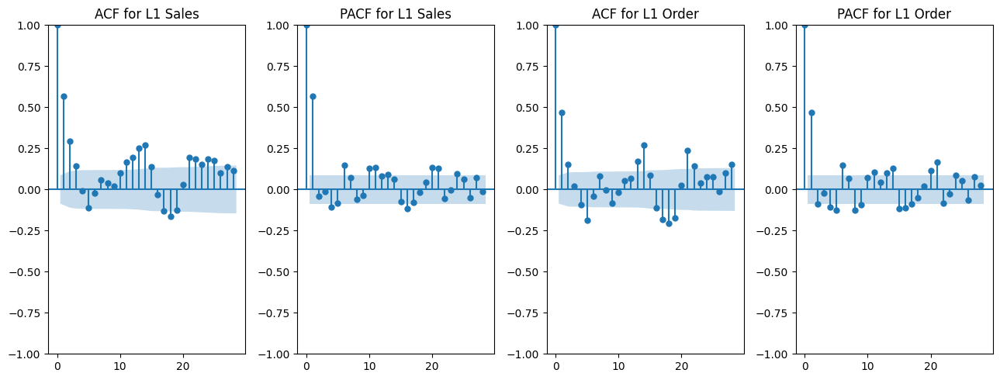

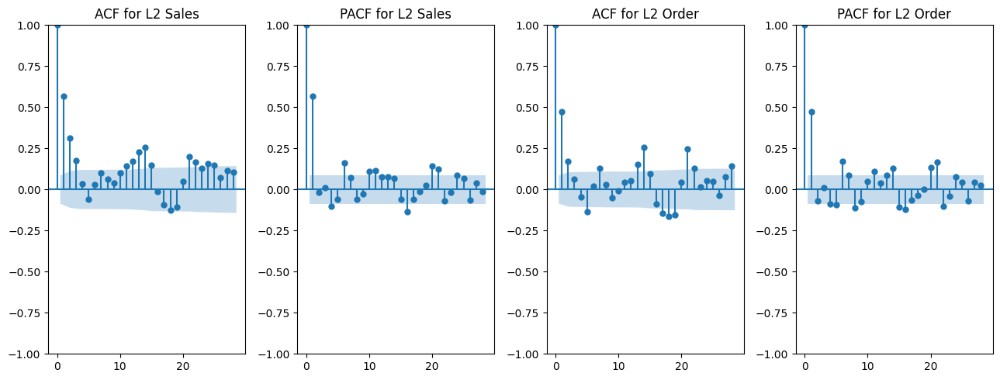

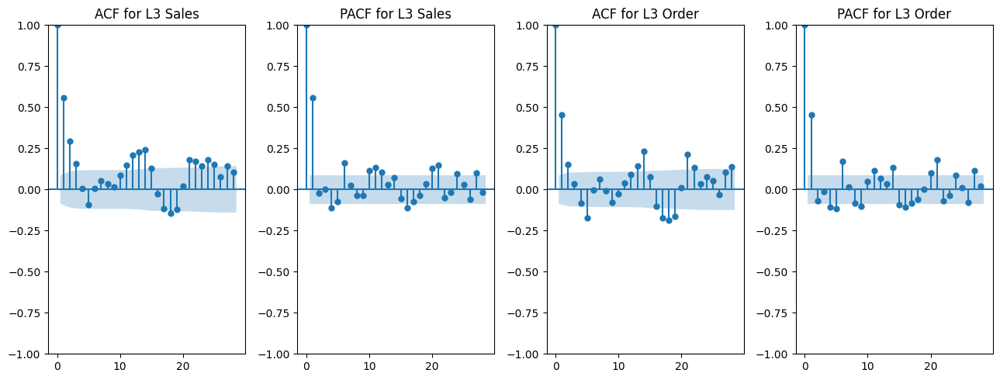

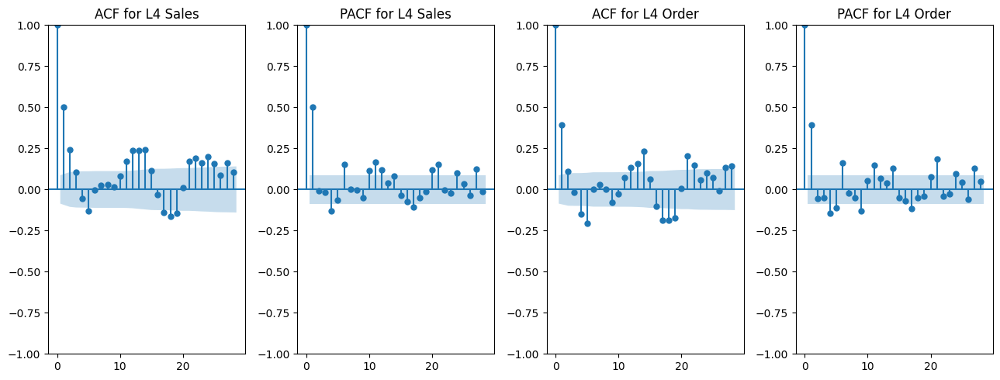

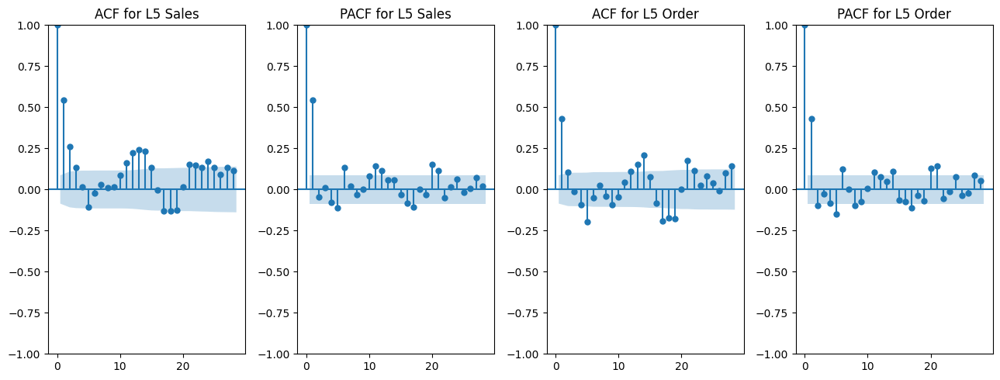

In [ ]:
# Location Wise Sales and Order ACF/PACF Plot
data_sales = location_wise_sales
data_order = location_wise_order
for column in data_sales.columns:
  acf_pacf_plot(data_sales[column], data_order[column])




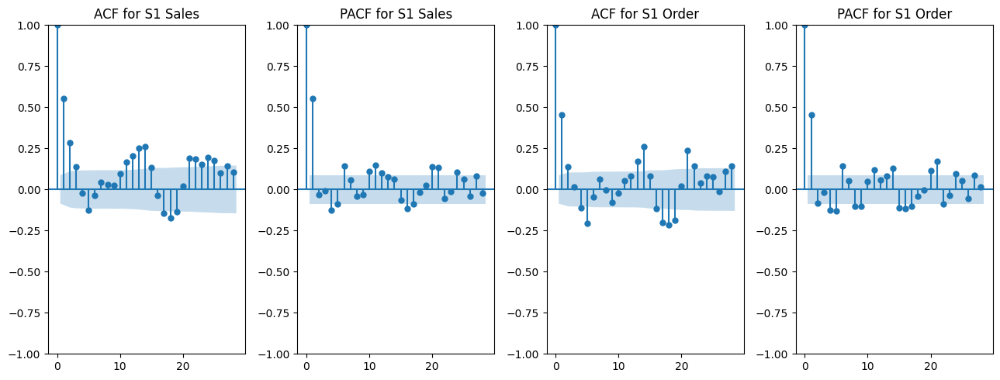

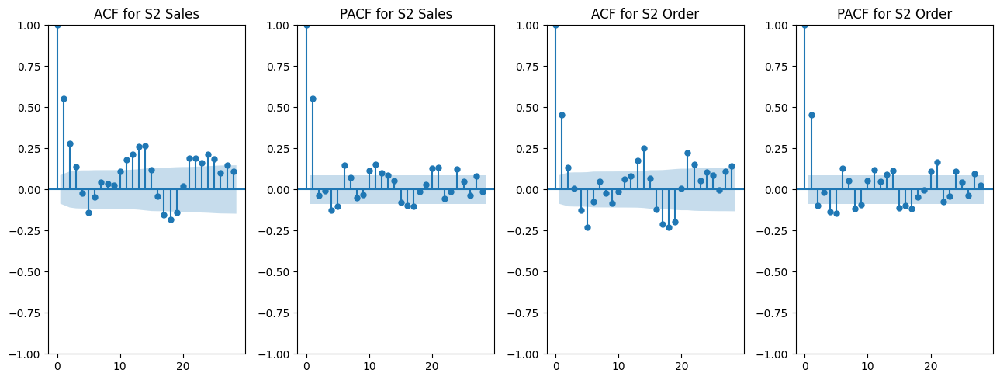

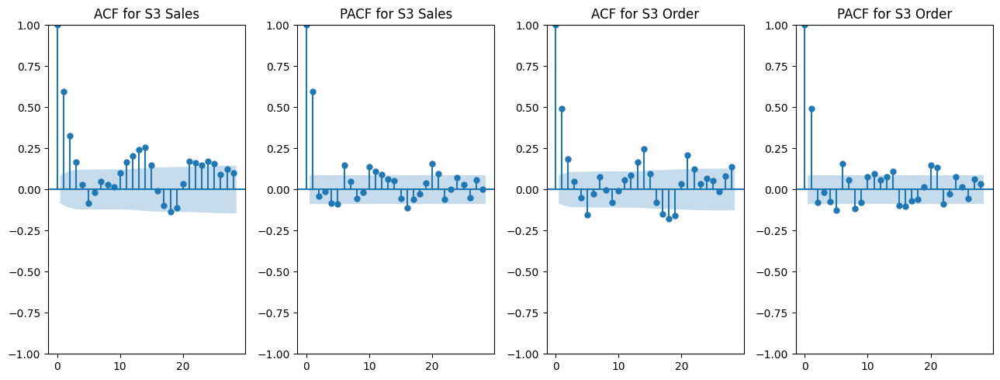

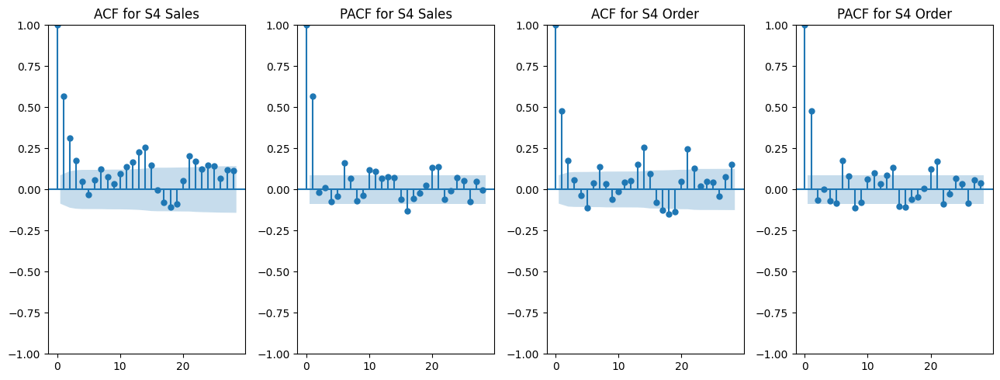

In [ ]:
# Store type Wise Sales and Order ACF/PACF Plot
data_sales = store_type_wise_sales
data_order = store_type_wise_order
for column in data_sales.columns:
  acf_pacf_plot(data_sales[column], data_order[column])

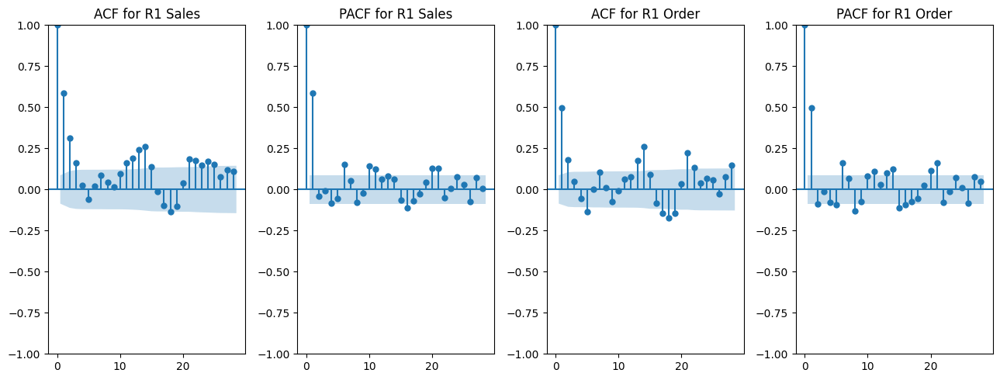

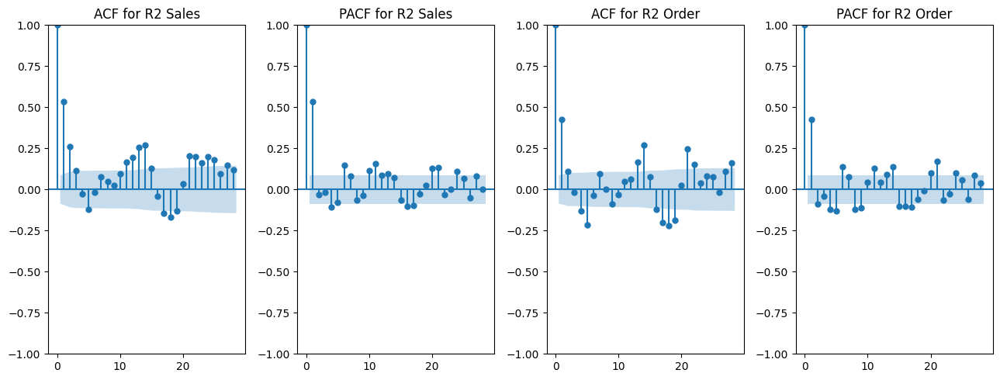

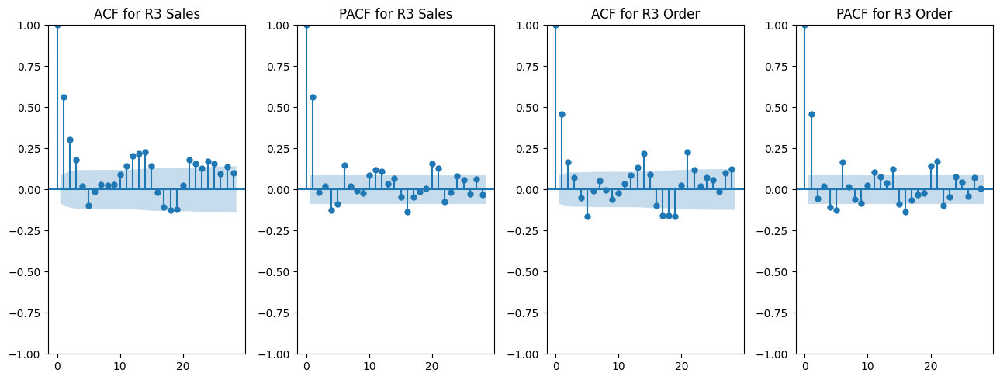

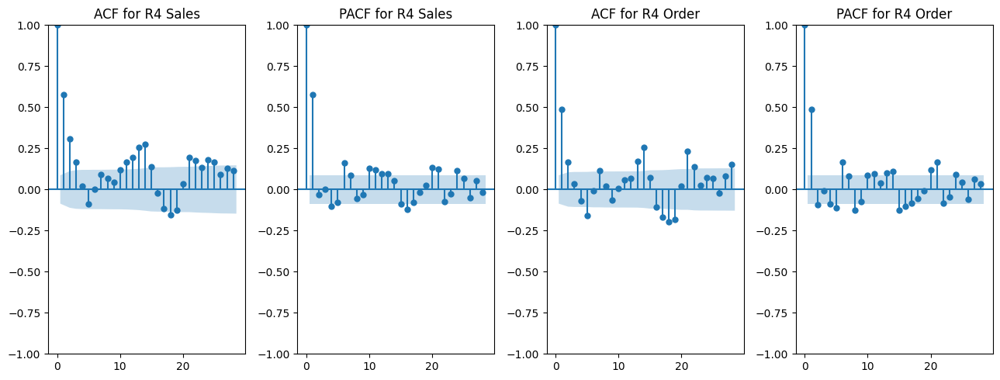

In [ ]:
# Region Wise Sales and Order ACF/PACF Plot
data_sales = region_wise_sales
data_order = region_wise_order
for column in data_sales.columns:
  acf_pacf_plot(data_sales[column], data_order[column])

## 10. Seasonality Charts

In [ ]:
# Seasonality Charts function
from statsmodels.tsa.seasonal import seasonal_decompose

def seasonal_chart(series_sales, series_order):

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
  # Plot Sales Seasonality in first cell
  result = seasonal_decompose(series_sales, model='additive', period=None)
  result.seasonal.plot(ax=ax1, color='teal')
  ax1.set_title(f'Seasonality for {series_sales.name} Sales')
  # Plot Order Seasonality in second cell
  result = seasonal_decompose(series_order, model='additive', period=None)
  result.seasonal.plot(ax=ax2, color='Orange')
  ax2.set_title(f'Seasonality for {series_order.name} Order')

  # Adjust layout
  plt.tight_layout()
  plt.show()



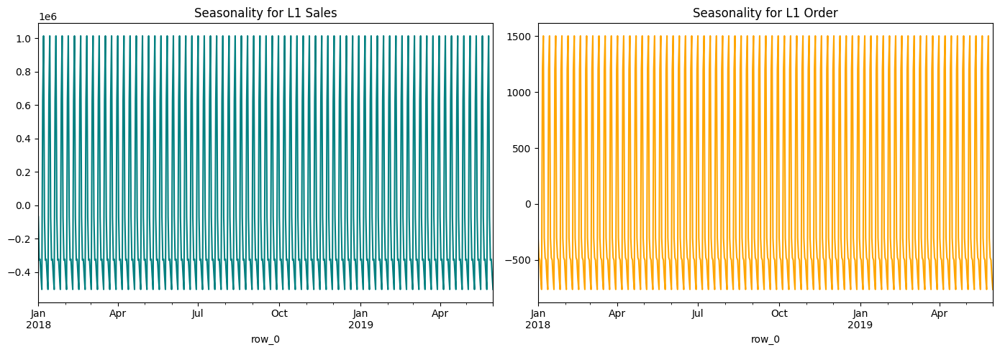

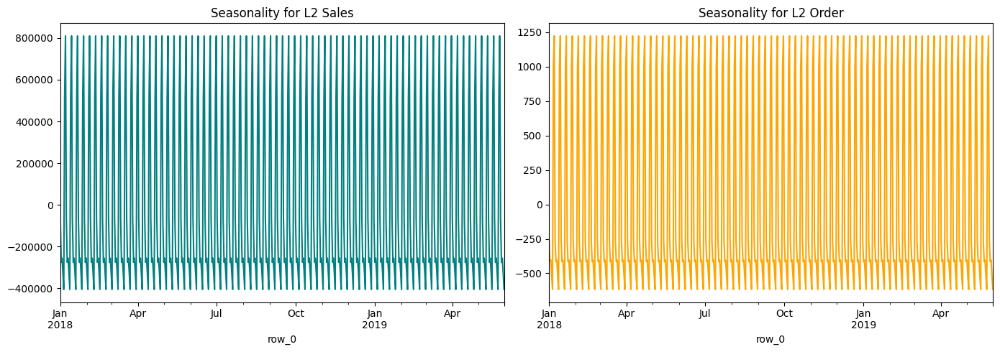

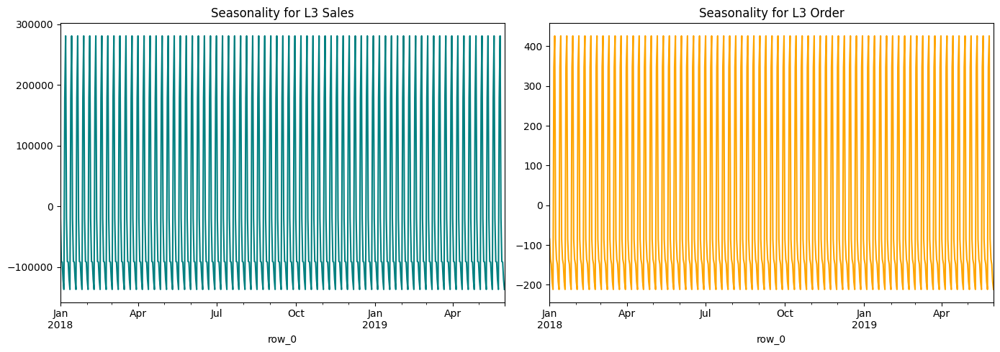

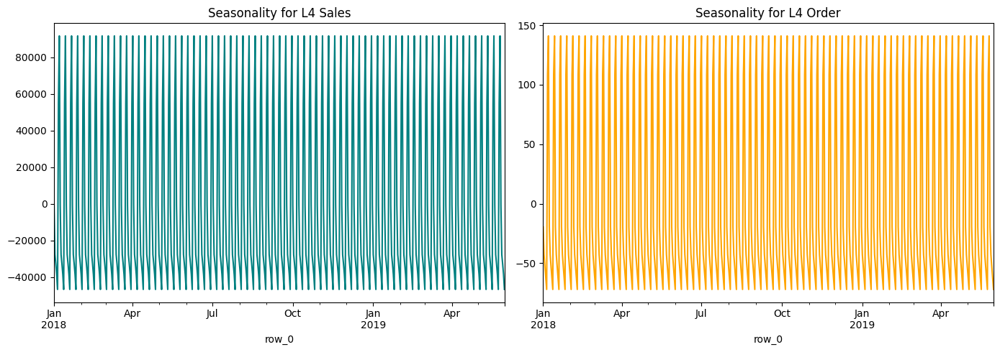

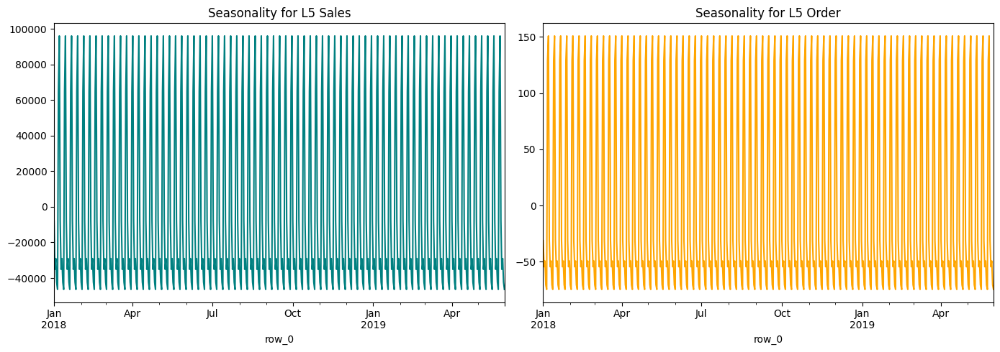

In [ ]:
# Location Wise Sales and Order Seasonality Plot
data_sales = location_wise_sales
data_order = location_wise_order
for column in data_sales.columns:
  seasonal_chart(data_sales[column], data_order[column])

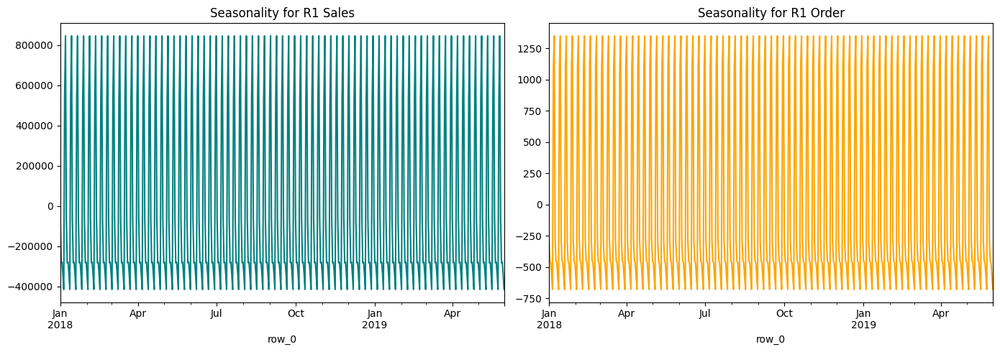

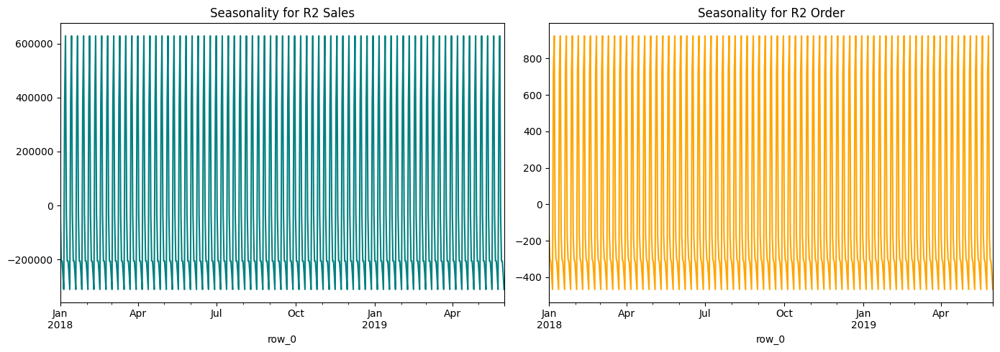

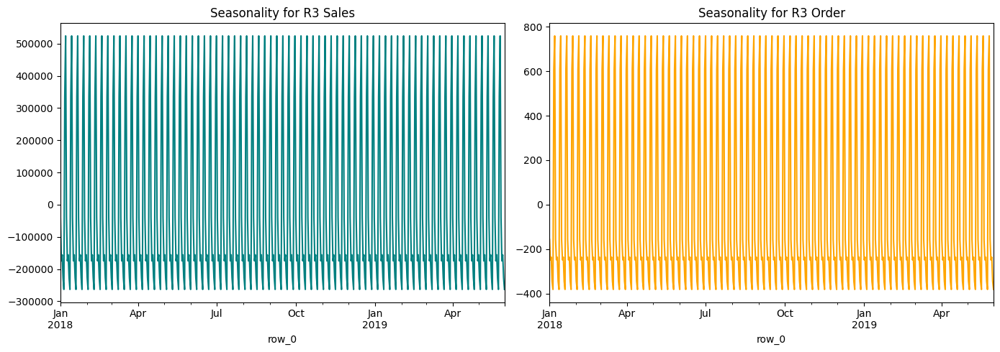

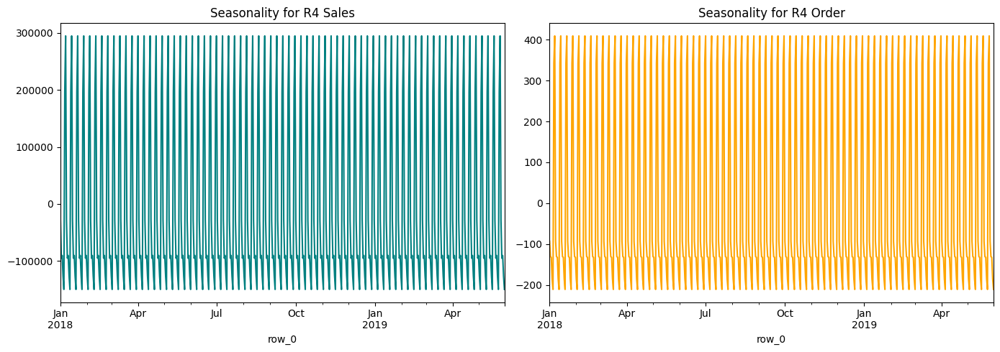

In [ ]:
# REgion Wise Sales and Order Seasonality Plot
data_sales = region_wise_sales
data_order = region_wise_order
for column in data_sales.columns:
  seasonal_chart(data_sales[column], data_order[column])

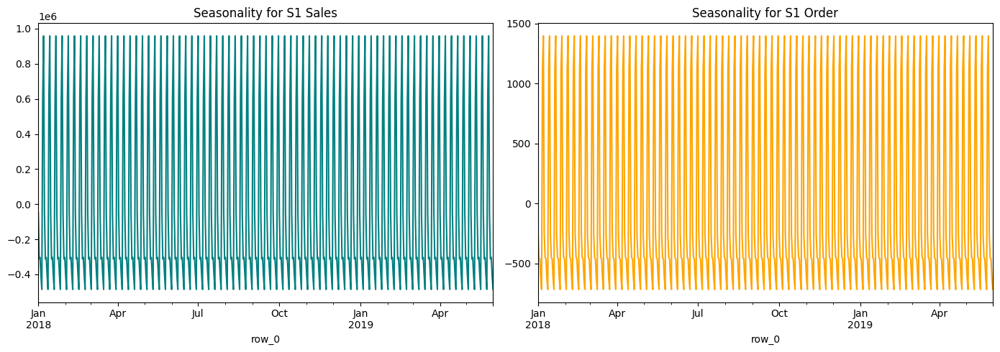

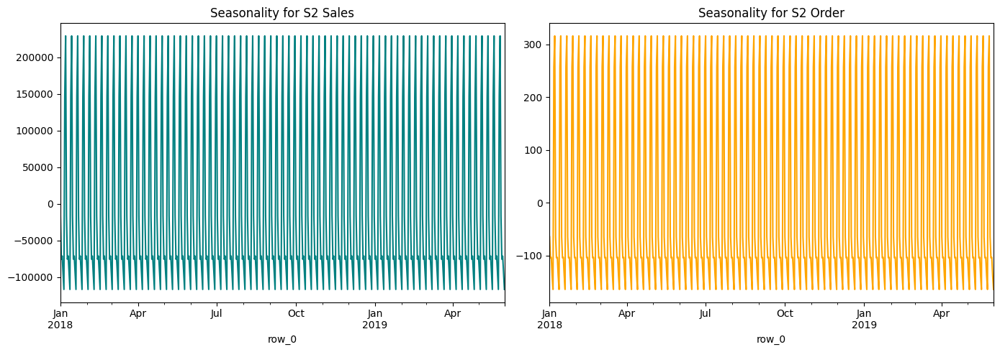

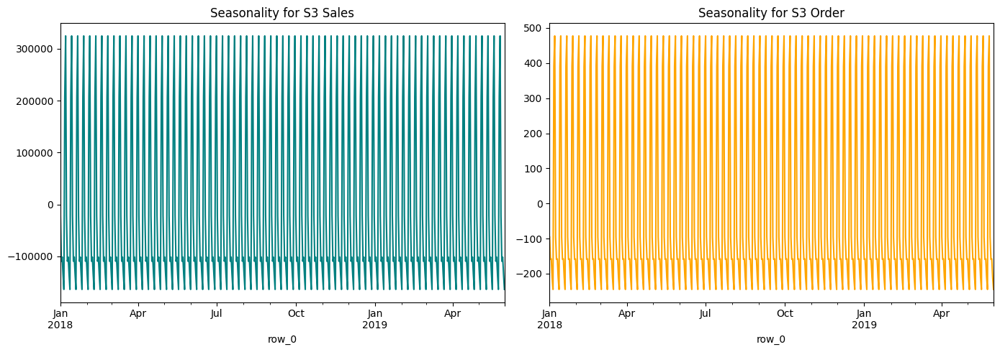

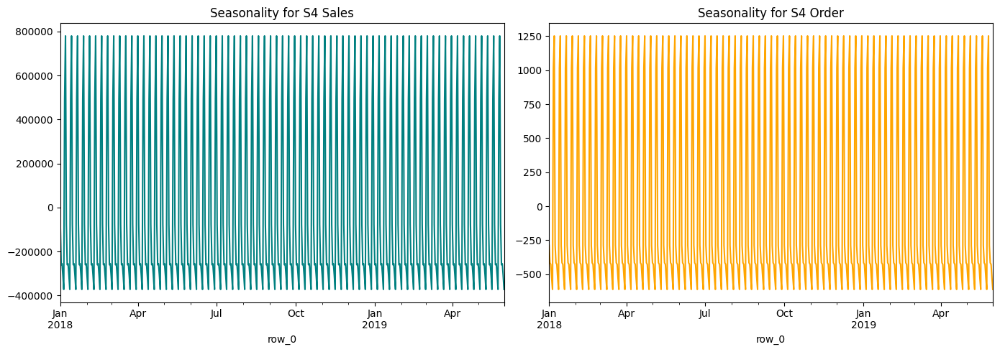

In [ ]:
# StoreType Wise Sales and Order Seasonality Plot
data_sales = store_type_wise_sales
data_order = store_type_wise_order
for column in data_sales.columns:
  seasonal_chart(data_sales[column], data_order[column])

# C. Model building and Evaluation

## 10. Data splitting

To build a model we will split data into 80:20 ratio. First 80% rows will be train data whereas remaininf 20% will be test data.

In [ ]:
# Train/Test splitting stage of pipeline
from sklearn.base import BaseEstimator, TransformerMixin

class TimeSeriesSplitter(BaseEstimator, TransformerMixin):
    def __init__(self, test_size=0.2):
        self.test_size = test_size
        self.train_data, self.test_data = None, None

    def fit(self, X, y=None):
        """No fitting required; just for compatibility."""
        return self

    def transform(self, X, y=None):
        """Split the single-column time series into train and test sets."""
        n_rows = len(X)
        split_index = int(n_rows * (1 - self.test_size))
        self.train_data = X.iloc[:split_index].asfreq('D')
        self.test_data = X.iloc[split_index:].asfreq('D')
        return self.train_data, self.test_data

## 11. SARIMAX Model Training

To  have better accuracy in forecasting we will use exogenous variable

### Model building preperation

In [ ]:
# Seasonality Factor function
def get_seasonal_factor_fft(data:pd.Series)->int:
    """
    Automatically detects seasonality using FFT.
    Args:
        data (pd.Series): Time series data.
    Returns:
        int: Seasonal factor (dominant period).
    """
    fft = np.fft.fft(data - np.mean(data))  # Remove mean for better results
    freqs = np.fft.fftfreq(len(data))
    magnitudes = np.abs(fft)
    dominant_freq = freqs[np.argmax(magnitudes[1:]) + 1]  # Ignore zero frequency
    seasonal_period = int(round(1 / dominant_freq)) if dominant_freq != 0 else None
    return abs(seasonal_period)

In [ ]:
for column in train_sales.columns:
  seasonal_factor_fft = get_seasonal_factor_fft(train_sales[column])
  print(f"Detected seasonal factor (FFT) {column}: {seasonal_factor_fft}")

Detected seasonal factor (FFT) Sales: 12
Detected seasonal factor (FFT) 1: 6
Detected seasonal factor (FFT) 2: 12
Detected seasonal factor (FFT) 3: 172
Detected seasonal factor (FFT) 4: 12
Detected seasonal factor (FFT) 5: 7
Detected seasonal factor (FFT) 6: 13
Detected seasonal factor (FFT) 7: 172
Detected seasonal factor (FFT) 8: 7
Detected seasonal factor (FFT) 9: 12
Detected seasonal factor (FFT) 10: 12
Detected seasonal factor (FFT) 11: 12
Detected seasonal factor (FFT) 12: 12
Detected seasonal factor (FFT) 13: 12
Detected seasonal factor (FFT) 14: 12
Detected seasonal factor (FFT) 15: 7
Detected seasonal factor (FFT) 16: 12
Detected seasonal factor (FFT) 17: 12
Detected seasonal factor (FFT) 18: 7
Detected seasonal factor (FFT) 19: 12
Detected seasonal factor (FFT) 20: 12
Detected seasonal factor (FFT) 21: 172
Detected seasonal factor (FFT) 22: 172
Detected seasonal factor (FFT) 23: 12
Detected seasonal factor (FFT) 24: 3
Detected seasonal factor (FFT) 25: 172
Detected seasonal f

In [ ]:
# Model training stage
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.base import BaseEstimator
from sklearn.metrics import (make_scorer, mean_squared_error as mse, mean_absolute_error as mae, mean_absolute_percentage_error as mape)
import mlflow.statsmodels # Import mlflow.statsmodels

class SARIMAXEstimator(BaseEstimator):
    def __init__(self, order=(1,0,1), seasonal_order = (1,0,1,12)):
        self.order = order
        self.seasonal_order = seasonal_order
        self.model_ = None

    def fit(self, X, exog=None):
      self.exog_train=exog
      try:
        if isinstance(self.exog_train, pd.Series):
          self.model_ = SARIMAX(X, exog=self.exog_train, order=self.order, seasonal_order=self.seasonal_order).fit(disp=False)
        else:
          self.model_ = SARIMAX(X, order=self.order, seasonal_order=self.seasonal_order).fit(disp=False)
      except Exception as e:
        print(f"Skipping: order={self.order}, seasonal_order={self.seasonal_order}. Error: {e}")
        self.model_ = None
      return self

    def predict(self, n_steps, exog=None):
      if self.model_ is None:
        return np.full(n_steps, 1E-10)
      try:
        if not isinstance(self.exog_train, pd.Series):
          return self.model_.forecast(steps=n_steps)
        elif isinstance(exog, pd.Series):
          return self.model_.forecast(steps=n_steps, exog=exog[:n_steps])
        else:
          raise ValueError('No exog data provided')
      except Exception as e:
        print(e)
      return None

    def score(self, X, exog=None):
        n_steps = len(X)
        predictions = self.predict(n_steps, exog)
        return mape(X, predictions)

In [ ]:
# Define the parameter grid
from itertools import product
p,d,q = range(1,2), [1], range(1, 2)
order = list(product(p, d, q))

# seasonal_parameters P, D, Q, S
P, D, Q, S = range(1, 2), [0], range(1, 2), [7]
seasonal_order = list(product(P, D, Q, S))

param_grid = list(product(order, seasonal_order))

### Model Training with MLFLow

In [ ]:
# Model training for sales forecasting with MLFLow
import cloudpickle
import tempfile
import os

mlflow.set_experiment("Sore ID Sales Forecasting-1.1.0")
for column in train_sales.columns[0:1]:
  splitter = TimeSeriesSplitter()
  X_train, X_test = splitter.fit_transform(train_sales[column])
  X_train_exog, X_test_exog = splitter.fit_transform(exog_train_holiday)
  for order, seasonal in param_grid:
    with mlflow.start_run():
      sarimax_estimator = SARIMAXEstimator(order=order, seasonal_order=seasonal)
      sarimax_estimator.fit(X=X_train, exog=X_train_exog)

      if sarimax_estimator.model_ is not None:
          model_score = sarimax_estimator.score(X=X_test, exog=X_test_exog)
          mlflow.set_tag('data', column)
          mlflow.log_params({'order': order, 'seasonal_order': seasonal})
          mlflow.log_metric('mape', model_score)

          # Manually save the model as a pickle file and log it as an artifact
          with tempfile.TemporaryDirectory() as tmpdir:
              model_path = os.path.join(tmpdir, "model.pkl")
              with open(model_path, "wb") as f:
                  cloudpickle.dump(sarimax_estimator.model_, f)
              # Log the model.pkl directly at the root of the artifacts
              mlflow.log_artifact(model_path)

      else:
          print(f"Model fitting failed for column {column} with order={order}, seasonal_order={seasonal}. Skipping logging of model artifact.")

2025/12/26 18:31:19 INFO mlflow.store.db.utils: Creating initial MLflow database tables...
2025/12/26 18:31:20 INFO mlflow.store.db.utils: Updating database tables
2025/12/26 18:31:20 INFO alembic.runtime.migration: Context impl SQLiteImpl.
2025/12/26 18:31:20 INFO alembic.runtime.migration: Will assume non-transactional DDL.
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running upgrade  -> 451aebb31d03, add metric step
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running upgrade 451aebb31d03 -> 90e64c465722, migrate user column to tags
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running upgrade 90e64c465722 -> 181f10493468, allow nulls for metric values
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running upgrade 181f10493468 -> df50e92ffc5e, Add Experiment Tags Table
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running upgrade df50e92ffc5e -> 7ac759974ad8, Update run tags with larger limit
2025/12/26 18:31:20 INFO alembic.runtime.migration: Running 

In [ ]:
# Model training for order forecasting with MLFLow
import cloudpickle
import tempfile
import os

mlflow.set_experiment("Sore ID Order Forecasting-1.1.0")
for column in train_order.columns[0:1]:
  splitter = TimeSeriesSplitter()
  X_train, X_test = splitter.fit_transform(train_order[column])
  X_train_exog, X_test_exog = splitter.fit_transform(exog_train_holiday)
  for order, seasonal in param_grid:
    with mlflow.start_run():
      sarimax_estimator = SARIMAXEstimator(order=order, seasonal_order=seasonal)
      sarimax_estimator.fit(X=X_train, exog=X_train_exog)

      if sarimax_estimator.model_ is not None:
          model_score = sarimax_estimator.score(X=X_test, exog=X_test_exog)
          mlflow.set_tag('data', column)
          mlflow.log_params({'order': order, 'seasonal_order': seasonal})
          mlflow.log_metric('mape', model_score)

          # Manually save the model as a pickle file and log it as an artifact
          with tempfile.TemporaryDirectory() as tmpdir:
              model_path = os.path.join(tmpdir, "model.pkl")
              with open(model_path, "wb") as f:
                  cloudpickle.dump(sarimax_estimator.model_, f)
              # Log the model.pkl directly at the root of the artifacts
              mlflow.log_artifact(model_path)

      else:
          print(f"Model fitting failed for column {column} with order={order}, seasonal_order={seasonal}. Skipping logging of model artifact.")

2025/12/26 18:31:23 INFO mlflow.tracking.fluent: Experiment with name 'Sore ID Order Forecasting-1.1.0' does not exist. Creating a new experiment.


# D. Forecasting Example

In [ ]:
import mlflow
import pandas as pd
import shutil
import os
import cloudpickle # Import cloudpickle for loading

# Create 'models' directory if it's not exist
if not os.path.exists('models'):
    os.makedirs('models')

# Get the MLflow client
client = mlflow.tracking.MlflowClient()

# Get the experiment by name for Order Forecasting
order_experiment = client.get_experiment_by_name("Sore ID Order Forecasting-1.1.0")

if order_experiment is None:
    print("MLflow experiment 'Sore ID Order Forecasting-1.1.0' not found. Please ensure the model training step was executed.")
else:
    order_exp_id = order_experiment.experiment_id

    # Search for runs within this experiment, ordered by MAPE ascending
    # Assuming 'Order' is the column name for the overall order forecasting
    runs = client.search_runs(
        experiment_ids=[order_exp_id],
        filter_string="tags.data = 'Order'", # Filter for the specific 'Order' data tag
        order_by=["metrics.mape ASC"], # Order by MAPE to find the best model
        max_results=1 # We only need the best one
    )

    if runs:
        best_run = runs[0]
        run_id = best_run.info.run_id
        data_tag = best_run.data.tags.get('data') # This should be 'Order'

        print(f"Found best run for '{data_tag}' forecasting: Run ID {run_id}, MAPE {best_run.data.metrics.get('mape')}")

        # Define a temporary path to download artifacts for this run
        temp_download_dir = os.path.join('mlflow_temp_artifacts', run_id)
        os.makedirs(temp_download_dir, exist_ok=True)

        # Download the 'model.pkl' artifact (logged directly at root)
        artifact_uri_to_download = client.get_run(run_id).info.artifact_uri + '/model.pkl'
        mlflow.artifacts.download_artifacts(artifact_uri=artifact_uri_to_download, dst_path=temp_download_dir)

        # The actual model file is now at temp_download_dir/model.pkl
        source_model_path = os.path.join(temp_download_dir, 'model.pkl')
        destination_filename = os.path.join('models', f'{data_tag.lower()}_order.pkl')

        # Move the model.pkl to its final destination
        shutil.move(source_model_path, destination_filename)
        print(f"Model for '{data_tag}' saved to {destination_filename}")

        # Clean up the temporary download directory
        shutil.rmtree(temp_download_dir)

    else:
        print("No runs found for 'Order' in 'Sore ID Order Forecasting-1.1.0' experiment. Cannot save model.")

Found best run for 'Order' forecasting: Run ID d7097aa496264dd99744a549a24a5790, MAPE 0.15094690023597634


Model for 'Order' saved to models/order_order.pkl


In [ ]:
import mlflow
import pandas as pd
import shutil
import os
import cloudpickle

# Get the MLflow client
client = mlflow.tracking.MlflowClient()

# Get the experiment by name for Sales Forecasting
sales_experiment = client.get_experiment_by_name("Sore ID Sales Forecasting-1.1.0")

if sales_experiment is None:
    print("MLflow experiment 'Sore ID Sales Forecasting-1.1.0' not found. Please ensure the model training step was executed.")
else:
    sales_exp_id = sales_experiment.experiment_id

    # Search for runs within this experiment, ordered by MAPE ascending
    # Assuming 'Sales' is the column name for the overall sales forecasting
    runs = client.search_runs(
        experiment_ids=[sales_exp_id],
        filter_string="tags.data = 'Sales'", # Filter for the specific 'Sales' data tag
        order_by=["metrics.mape ASC"], # Order by MAPE to find the best model
        max_results=1 # We only need the best one
    )

    if runs:
        best_run = runs[0]
        run_id = best_run.info.run_id
        data_tag = best_run.data.tags.get('data') # This should be 'Sales'

        print(f"Found best run for '{data_tag}' forecasting: Run ID {run_id}, MAPE {best_run.data.metrics.get('mape')}")

        # Define a temporary path to download artifacts for this run
        temp_download_dir = os.path.join('mlflow_temp_artifacts', run_id)
        os.makedirs(temp_download_dir, exist_ok=True)

        # Download the 'model.pkl' artifact (logged directly at root)
        artifact_uri_to_download = client.get_run(run_id).info.artifact_uri + '/model.pkl'
        mlflow.artifacts.download_artifacts(artifact_uri=artifact_uri_to_download, dst_path=temp_download_dir)

        # The actual model file is now at temp_download_dir/model.pkl
        source_model_path = os.path.join(temp_download_dir, 'model.pkl')
        destination_filename = os.path.join('models', f'{data_tag.lower()}_sales.pkl')

        # Move the model.pkl to its final destination
        shutil.move(source_model_path, destination_filename)
        print(f"Model for '{data_tag}' saved to {destination_filename}")

        # Clean up the temporary download directory
        shutil.rmtree(temp_download_dir)

    else:
        print("No runs found for 'Sales' in 'Sore ID Sales Forecasting-1.1.0' experiment. Cannot save model.")

Found best run for 'Sales' forecasting: Run ID 11a25e53f41c45afae60e4d97650fcb5, MAPE 0.19729424250763192


Model for 'Sales' saved to models/sales_sales.pkl


In [ ]:
import cloudpickle as pickle
with open('models/sales_sales.pkl', 'rb') as file:
    model = pickle.load(file)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  412
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -6643.432
Date:                           Fri, 26 Dec 2025   AIC                          13298.864
Time:                                   18:31:25   BIC                          13322.975
Sample:                               01-01-2018   HQIC                         13308.402
                                    - 02-16-2019                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Holiday    -2.225e+06   1.32e-09  -1.68e+15      0.000   -2.23e+06   -2.23e+06
ar.L1          0.5814      0.042     13.805      0.000       0.499       0.664
ma.L1         -0.9989      0.021    -46.864      0.000      -1.041      -0.957
ar.S.L7        0.9963      0.013     74.994      0.000       0.970       1.022
ma.S.L7       -0.9707      0.056    -17.266      0.000      -1.081      -0.860
sigma2      8.338e+12   3.67e-15   2.27e+27      0.000    8.34e+12    8.34e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.55   Jarque-Bera (JB):               507.31
Prob(Q):                              0.46   Prob(JB):                         0.00
Heteroskedasticity (H):               0.85   Skew:                            -0.65
Prob(H) (two-sided):                  0.34   Kurtosis:                         8.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.91e+41. Standard errors may be unstable.
"""

In [ ]:
# Forecasting values
# Define the number of days to forecast
n = 50

# Re-run splitter to get consistent train/test sets for 'Sales'
# This ensures that X_train_sales, X_test_sales, and X_test_exog_sales align with how the model was trained and evaluated.
splitter = TimeSeriesSplitter()
X_train_sales, X_test_sales = splitter.fit_transform(overall_sales['Sales'])
_, X_test_exog_sales = splitter.fit_transform(exog_train_holiday) # Only need the test part of exog_train_holiday

# Prepare data for plotting
df_plot = X_train_sales
test_plot = X_test_sales.iloc[:n] # Take the first 'n' days of the actual test data
exog_for_pred = X_test_exog_sales.iloc[:n] # Exogenous variables for the prediction period

# Generate predictions using the loaded model
test_plot['pred'] = model.forecast(steps=n, exog=exog_for_pred)

# Create and display the plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_plot.index, y=df_plot, mode='lines', name='Train values', line=dict(color='green')))
fig.add_trace(go.Scatter(x=test_plot.index, y=test_plot, mode='lines', name='Test values', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test_plot.index, y=test_plot['pred'], mode='lines', name='Forecasting', line=dict(color='red')))
fig.update_layout(title_text='Forecasting of overall Sales', # Updated title for clarity
                  title_x=0.5, title_y=0.85,
                  legend_x=0)
fig.show()

In [ ]:
import cloudpickle as pickle
with open('models/sales_sales.pkl', 'rb') as file:
    model = pickle.load(file)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Sales   No. Observations:                  412
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -6643.432
Date:                           Fri, 26 Dec 2025   AIC                          13298.864
Time:                                   18:31:25   BIC                          13322.975
Sample:                               01-01-2018   HQIC                         13308.402
                                    - 02-16-2019                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Holiday    -2.225e+06   1.32e-09  -1.68e+15      0.000   -2.23e+06   -2.23e+06
ar.L1          0.5814      0.042     13.805      0.000       0.499       0.664
ma.L1         -0.9989      0.021    -46.864      0.000      -1.041      -0.957
ar.S.L7        0.9963      0.013     74.994      0.000       0.970       1.022
ma.S.L7       -0.9707      0.056    -17.266      0.000      -1.081      -0.860
sigma2      8.338e+12   3.67e-15   2.27e+27      0.000    8.34e+12    8.34e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.55   Jarque-Bera (JB):               507.31
Prob(Q):                              0.46   Prob(JB):                         0.00
Heteroskedasticity (H):               0.85   Skew:                            -0.65
Prob(H) (two-sided):                  0.34   Kurtosis:                         8.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.91e+41. Standard errors may be unstable.
"""

In [ ]:
sub_to_forecast = 'Sales' # Changed to 'Sales' to match the loaded overall sales model
n = 50              # Number of days

# Create splitter instance
splitter = TimeSeriesSplitter()

# Split the overall sales data and the exogenous holiday data for the overall sales model
X_train_data, X_test_data = splitter.fit_transform(overall_sales[sub_to_forecast])
_, X_test_exog_data = splitter.fit_transform(exog_train_holiday)

# Use the 'n' variable to define the length of the test data for plotting and forecasting
test_plot_data = X_test_data.iloc[:n] # Actual test values for the first 'n' days
exog_for_forecast = X_test_exog_data.iloc[:n] # Exogenous variables for the forecast period

# The model 'model' is already loaded from 'models/sales_sales.pkl' in cell PY0ujvvmwZaw

# Generate predictions using the loaded model
test_plot_data['pred'] = model.forecast(steps=n, exog=exog_for_forecast)

fig = go.Figure()
fig.add_trace(go.Scatter(x=X_train_data.index, y=X_train_data, mode='lines', name='Train values', line=dict(color='green')))
fig.add_trace(go.Scatter(x=test_plot_data.index, y=test_plot_data, mode='lines', name='Test values', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test_plot_data.index, y=test_plot_data['pred'], mode='lines', name='Forecasting', line=dict(color='red')))
fig.update_layout(title_text=f'Forecasting of {sub_to_forecast}',
                  title_x=0.5,title_y=0.85,
                  legend_x=0)
fig.show()

In [ ]:
import cloudpickle as pickle
with open('models/order_order.pkl', 'rb') as file:
    model = pickle.load(file)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Order   No. Observations:                  412
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -3938.587
Date:                           Fri, 26 Dec 2025   AIC                           7889.174
Time:                                   18:31:25   BIC                           7913.286
Sample:                               01-01-2018   HQIC                          7898.713
                                    - 02-16-2019                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Holiday    -3412.0755    640.458     -5.328      0.000   -4667.350   -2156.801
ar.L1          0.5009      0.041     12.166      0.000       0.420       0.582
ma.L1         -0.9982      0.011    -91.624      0.000      -1.020      -0.977
ar.S.L7        0.9961      0.013     79.606      0.000       0.972       1.021
ma.S.L7       -0.9644      0.059    -16.368      0.000      -1.080      -0.849
sigma2      1.711e+07      0.094   1.83e+08      0.000    1.71e+07    1.71e+07
===================================================================================
Ljung-Box (L1) (Q):                   0.25   Jarque-Bera (JB):               908.66
Prob(Q):                              0.62   Prob(JB):                         0.00
Heteroskedasticity (H):               0.77   Skew:                            -0.99
Prob(H) (two-sided):                  0.12   Kurtosis:                        10.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.16e+24. Standard errors may be unstable.
"""

In [ ]:
# Forecasting values
sub_to_forecast = 'Order' # Changed to 'Order' to match the loaded overall order model
n = 50              # Number of days

# Create splitter instance
splitter = TimeSeriesSplitter()

# Split the overall order data and the exogenous holiday data for the overall order model
X_train_data_order, X_test_data_order = splitter.fit_transform(overall_order[sub_to_forecast])
_, X_test_exog_data_order = splitter.fit_transform(exog_train_holiday) # Only need the test part of exog_train_holiday

# Use the 'n' variable to define the length of the test data for plotting and forecasting
test_plot_data_order = X_test_data_order.iloc[:n] # Actual test values for the first 'n' days
exog_for_forecast_order = X_test_exog_data_order.iloc[:n] # Exogenous variables for the forecast period

# The model 'model' is already loaded from 'models/order_order.pkl' in cell hnZfqILrwZaw

# Generate predictions using the loaded model
test_plot_data_order['pred'] = model.forecast(steps=n, exog=exog_for_forecast_order)

fig = go.Figure()
fig.add_trace(go.Scatter(x=X_train_data_order.index, y=X_train_data_order, mode='lines', name='Train values', line=dict(color='green')))
fig.add_trace(go.Scatter(x=test_plot_data_order.index, y=test_plot_data_order, mode='lines', name='Test values', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test_plot_data_order.index, y=test_plot_data_order['pred'], mode='lines', name='Forecasting', line=dict(color='red')))
fig.update_layout(title_text=f'Forecasting of overall {sub_to_forecast}', # Updated title for clarity
                  title_x=0.5,title_y=0.85,
                  legend_x=0)
fig.show()

## ✅ Observations
- Sales and Orders move together, when orders increase, sales also increase.
- Discounts lead to higher customer activity compared to non-discount days.
- Sales and orders drop noticeably on holidays.
- Performance varies significantly across Store Type, Location Type, and Region.
- Clear seasonal patterns exist across months and days of the week.
- Time-series statistical tests show the data is suitable for forecasting.

---

## 🔍 Key Insights
- **Discounts are effective** : They significantly boost both sales and order volume.
- **Holidays negatively impact business** : Lower sales and fewer orders are recorded during holidays.
- **Store characteristics matter** : Store Type, Region, and Location strongly influence performance.
- **Strong seasonality exists** : Sales follow predictable monthly and weekly patterns.
- **Reliable forecasting potential** : Data supports accurate time-series forecasting.




In [ ]:
from google.colab import files
files.download("report.pdf")


FileNotFoundError: Cannot find file: report.pdf